# HOME CREDIT SCORE CARD MODEL

**Project Backgorund:**

PT Home Credit Indonesia is a technology-based financing company with a wide range of store partners in more than 200 cities in Indonesia. PT Home Credit Indonesia has been operating since 2013, Home Credit has now grown to become a trusted financial partner for millions of customers. PT Home Credit Indonesia also encourages open access to transparent financial services with a fast process and is able to help people meet their needs in a planned manner including managing their finances and installments properly.

In providing a loan to someone, PT Home Credit Indonesia will definitely assess the credit risk of the borrower. To assist in the credit risk assessment process, PT Home Credit Indonesia needs an accurate and reliable credit score model. A credit score is a metric used to predict the likelihood that a borrower will default within a certain period of time. This score is calculated based on various factors such as credit history, income, employment, and other demographic information.

**Problem Statement:**

The main objective of this project is to build an accurate and reliable credit score model for PT Home Credit Indonesia. This model will be used to evaluate potential borrowers and help make better lending decisions.

**Purpose:**

By solving this problem, Home Credit was able to improve their credit risk assessment process, reduce default losses, and ultimately improve the profitability and sustainability of their business.

**Steps in creating a model:**

1. Import Libraries
2. Import the dataset (train and test)
3. Exploratory Data Analysis
4. Data Cleaning
5. Data Preprocessing
6. Model Building
7. Model Evaluation

## Import Libraries

In [1]:
# Import Library used
import xgboost as xgb
import seaborn as sns
import plotly.offline as pyo
import plotly.graph_objs as go
import plotly.express as px
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import altair as alt
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, confusion_matrix, ConfusionMatrixDisplay
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from sklearn import preprocessing
from scipy import stats
from plotly.subplots import make_subplots
from imblearn.under_sampling import RandomUnderSampler
from imblearn.over_sampling import SMOTE

## Import Dataset

In [2]:
# Import Data Train and Test
train = pd.read_csv("/content/application_train.csv")
test = pd.read_csv("/content/application_test.csv")

# Print Data Train and Test
print("The following is the train data used:")
display(train.head())
print("\nThe following is the test data used:")
display(test.head())

The following is the train data used:


,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,...,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
0,100002,1,Cash loans,M,N,Y,0,202500.0,406597.5,24700.5,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,1.0
1,100003,0,Cash loans,F,N,N,0,270000.0,1293502.5,35698.5,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
2,100004,0,Revolving loans,M,Y,Y,0,67500.0,135000.0,6750.0,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
3,100006,0,Cash loans,F,N,Y,0,135000.0,312682.5,29686.5,...,0,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN
4,100007,0,Cash loans,M,N,Y,0,121500.0,513000.0,21865.5,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0



The following is the test data used:


,SK_ID_CURR,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,...,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
0,100001,Cash loans,F,N,Y,0,135000.0,568800.0,20560.5,450000.0,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
1,100005,Cash loans,M,N,Y,0,99000.0,222768.0,17370.0,180000.0,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,3.0
2,100013,Cash loans,M,Y,Y,0,202500.0,663264.0,69777.0,630000.0,...,0,0,0,0,0.0,0.0,0.0,0.0,1.0,4.0
3,100028,Cash loans,F,N,Y,2,315000.0,1575000.0,49018.5,1575000.0,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,3.0
4,100038,Cash loans,M,Y,N,1,180000.0,625500.0,32067.0,625500.0,...,0,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN


In [3]:
# Check train data information
train.info(verbose=True)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 307511 entries, 0 to 307510
Data columns (total 122 columns):
 #    Column                        Dtype  
---   ------                        -----  
 0    SK_ID_CURR                    int64  
 1    TARGET                        int64  
 2    NAME_CONTRACT_TYPE            object 
 3    CODE_GENDER                   object 
 4    FLAG_OWN_CAR                  object 
 5    FLAG_OWN_REALTY               object 
 6    CNT_CHILDREN                  int64  
 7    AMT_INCOME_TOTAL              float64
 8    AMT_CREDIT                    float64
 9    AMT_ANNUITY                   float64
 10   AMT_GOODS_PRICE               float64
 11   NAME_TYPE_SUITE               object 
 12   NAME_INCOME_TYPE              object 
 13   NAME_EDUCATION_TYPE           object 
 14   NAME_FAMILY_STATUS            object 
 15   NAME_HOUSING_TYPE             object 
 16   REGION_POPULATION_RELATIVE    float64
 17   DAYS_BIRTH                    int64  
 18   DA

In [4]:
# Check descriptive statistics of train data before cleaning
train.describe().transpose()

,count,mean,std,min,25%,50%,75%,max
SK_ID_CURR,307511.0,278180.518577,102790.175348,100002.0,189145.5,278202.0,367142.5,456255.0
TARGET,307511.0,0.080729,0.272419,0.0,0.0,0.0,0.0,1.0
CNT_CHILDREN,307511.0,0.417052,0.722121,0.0,0.0,0.0,1.0,19.0
AMT_INCOME_TOTAL,307511.0,168797.919297,237123.146279,25650.0,112500.0,147150.0,202500.0,117000000.0
AMT_CREDIT,307511.0,599025.999706,402490.776996,45000.0,270000.0,513531.0,808650.0,4050000.0
...,...,...,...,...,...,...,...,...
AMT_REQ_CREDIT_BUREAU_DAY,265992.0,0.007000,0.110757,0.0,0.0,0.0,0.0,9.0
AMT_REQ_CREDIT_BUREAU_WEEK,265992.0,0.034362,0.204685,0.0,0.0,0.0,0.0,8.0
AMT_REQ_CREDIT_BUREAU_MON,265992.0,0.267395,0.916002,0.0,0.0,0.0,0.0,27.0
AMT_REQ_CREDIT_BUREAU_QRT,265992.0,0.265474,0.794056,0.0,0.0,0.0,0.0,261.0


## Exploratory Data Analysis

Variable description
1. Target = 1, have problems with payments
2. Target = 0, have no problems with payments

In [5]:
# Make a copy of the original data
df = train.copy()

# Converting XNA to NaN
df.replace("XNA", np.nan,inplace=True)

df["TARGET"].replace(0, "Don't Have Problem",inplace=True)
df["TARGET"].replace(1, "Have Problem",inplace=True)
df = df.rename(columns={'TARGET': 'Status'})

### Client demographic information

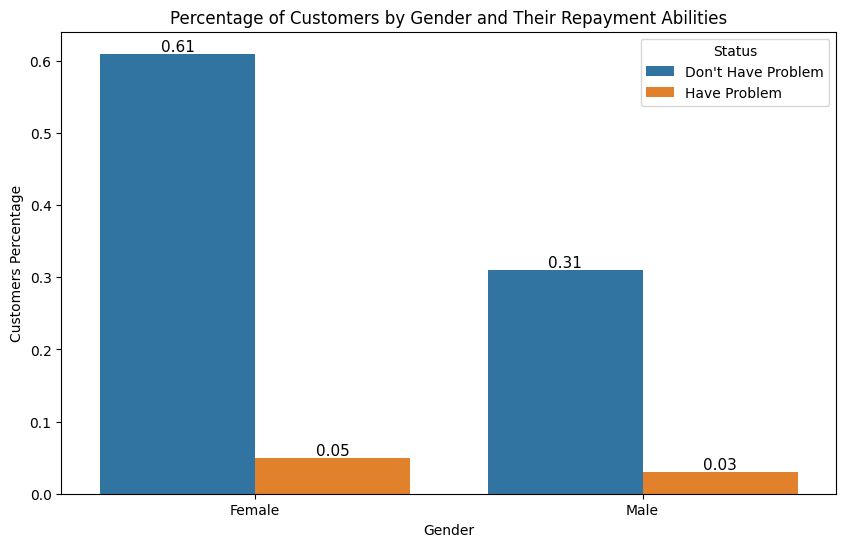

In [6]:
# Create a gender dataframe containing the number of customers by gender
gender = df.groupby(['CODE_GENDER', 'Status']).size().reset_index(name='Customers')
gender["CODE_GENDER"].replace("F", "Female",inplace=True)
gender["CODE_GENDER"].replace("M", "Male",inplace=True)
gender['Customers_Percentage'] = round(gender.Customers / gender.Customers.sum(), 2)

# Create a Bar chart
plt.figure(figsize=(10,6))
ax = sns.barplot(data=gender, x='CODE_GENDER', y='Customers_Percentage', hue='Status')

# Adding values on top of each bar
for p in ax.patches:
    height = p.get_height()
    if height != 0:
        ax.annotate(f'{height}',
                    (p.get_x() + p.get_width() / 2., height),
                    ha='center', va='center', fontsize=11, color='black', xytext=(0, 5),
                    textcoords='offset points')

plt.title('Percentage of Customers by Gender and Their Repayment Abilities')
plt.xlabel('Gender')
plt.ylabel('Customers Percentage')
plt.legend(title='Status', loc='upper right')
plt.show()

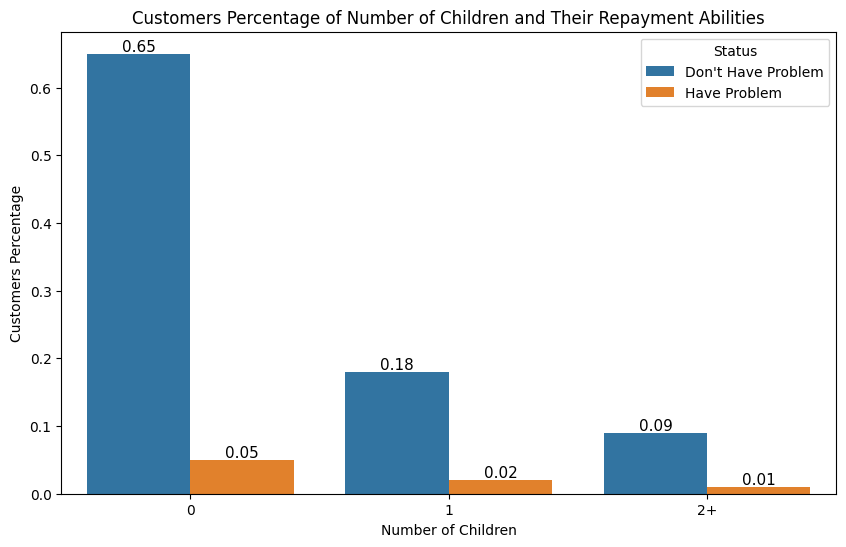

In [7]:
# Sum customers who have at least 2 children into 1 data.
df['CNT_CHILDREN'] = df['CNT_CHILDREN'].apply(lambda x: '2+' if x >= 2 else str(x))

# Grouping by number of children and counting the number of each one
child = df.groupby(['CNT_CHILDREN', 'Status']).size().reset_index(name='Customers')
child['Customers_Percentage'] = round(child.Customers / child.Customers.sum(), 2)

# Create a Bar Chart
plt.figure(figsize=(10, 6))
ax = sns.barplot(data=child, x='CNT_CHILDREN', y='Customers_Percentage', hue='Status')

# Adding values on top of each bar
for p in ax.patches:
    height = p.get_height()
    if height != 0:
        ax.annotate(f'{height}',
                    (p.get_x() + p.get_width() / 2., height),
                    ha='center', va='center', fontsize=11, color='black', xytext=(0, 5),
                    textcoords='offset points')

plt.title('Customers Percentage of Number of Children and Their Repayment Abilities')
plt.xlabel('Number of Children')
plt.ylabel('Customers Percentage')
plt.legend(title='Status', loc='upper right')
plt.show()

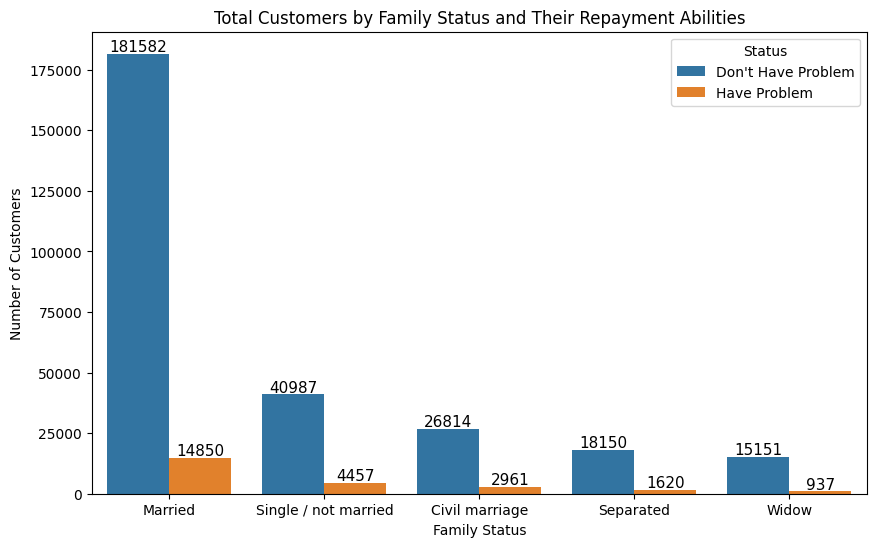

In [8]:
# Grouping by number of children and counting the number of each one
family_status = df.groupby(['NAME_FAMILY_STATUS', 'Status']).size().reset_index(name='Customers')

# Delete "Unknown" Data
family_status = family_status.loc[family_status['NAME_FAMILY_STATUS'] != 'Unknown']

# Sort DataFrame based on 'Customers'
family_status = family_status.sort_values(by=['Status', 'Customers'], ascending=[True, False])

# Create a Bar Chart
plt.figure(figsize=(10, 6))
ax = sns.barplot(data=family_status, x='NAME_FAMILY_STATUS', y='Customers', hue='Status')

# Adding values on top of each bar
for p in ax.patches:
    height = p.get_height()
    if height != 0:
        ax.annotate(f'{int(height)}',
                    (p.get_x() + p.get_width() / 2., height),
                    ha='center', va='center', fontsize=11, color='black', xytext=(0, 5),
                    textcoords='offset points')

plt.title('Total Customers by Family Status and Their Repayment Abilities')
plt.xlabel('Family Status')
plt.ylabel('Number of Customers')
plt.legend(title='Status', loc='upper right')
plt.show()

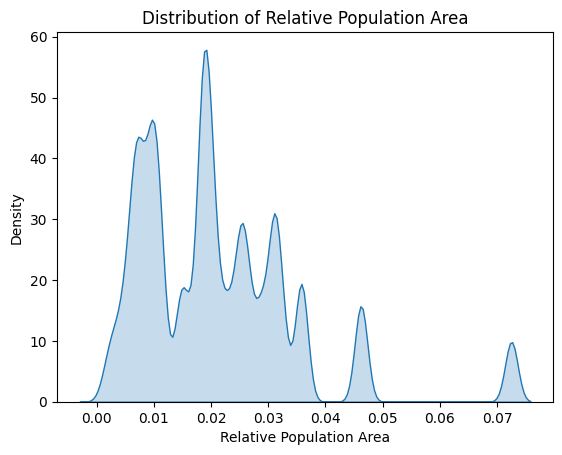

In [9]:
# Create a KDE plot
sns.kdeplot(df["REGION_POPULATION_RELATIVE"], fill=True)
plt.title('Distribution of Relative Population Area')
plt.xlabel('Relative Population Area')
plt.ylabel('Density')
plt.show()

### Income and employment information

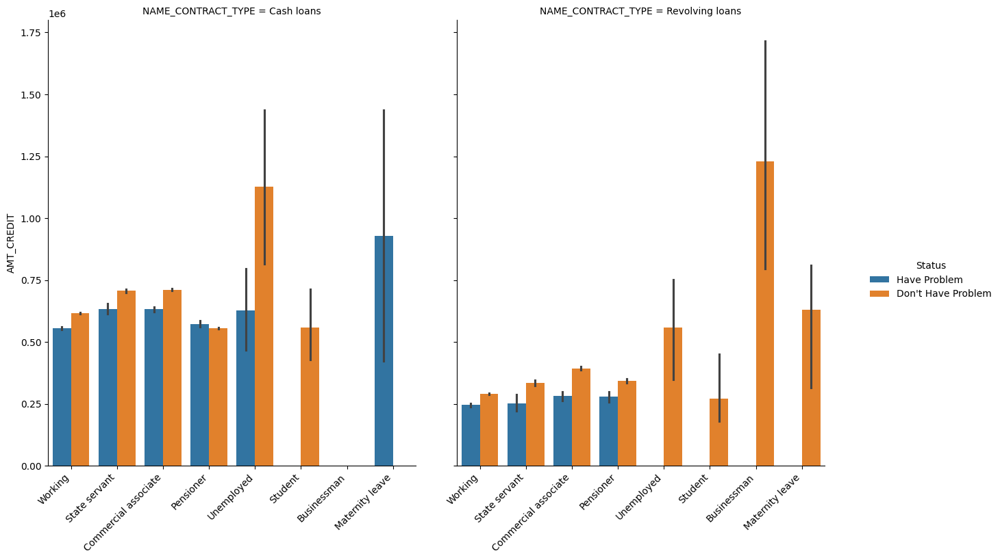

In [10]:
income = train.copy()
income["TARGET"].replace(0, "Don't Have Problem",inplace=True)
income["TARGET"].replace(1, "Have Problem",inplace=True)
income = income.rename(columns={'TARGET': 'Status'})

fig = sns.catplot(x = 'NAME_INCOME_TYPE',
            y = 'AMT_CREDIT',
            hue = 'Status',
            col = 'NAME_CONTRACT_TYPE',
            kind = 'bar',
            data = income)

fig.set_xticklabels(rotation=45, horizontalalignment='right')
plt.gcf().set_size_inches(15, 8)

# Delete x label
for ax in fig.axes.flat:
    ax.set_xlabel('')
    ax.xaxis.label.set_visible(False)

plt.show()

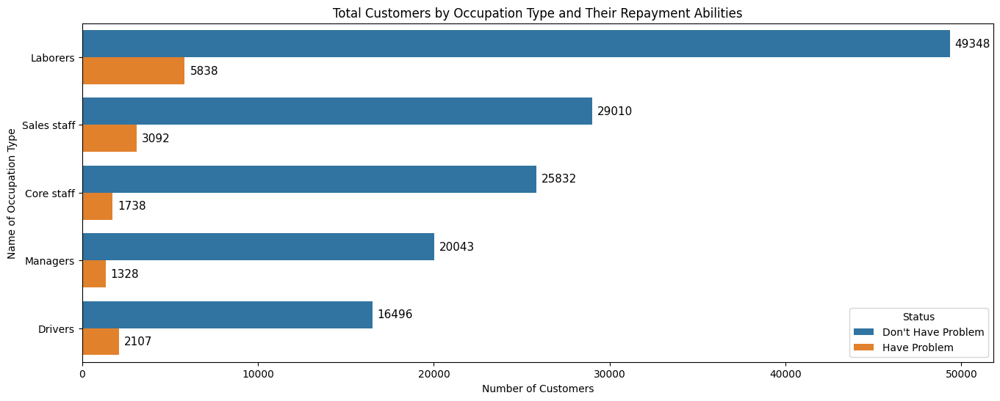

In [11]:
# Grouping by number of children and counting the number of each one
occupation_type = df.groupby(['OCCUPATION_TYPE', 'Status']).size().reset_index(name='Customers')

# Sort DataFrame based on 'Customers' where TARGET=1
occupation_type = occupation_type.sort_values(by=['Status', 'Customers'], ascending=[True, False])

# Delete data from 6th to the end
labels_to_drop = ['Accountants', 'Cleaning staff', 'Cooking staff', 'Private service staff', 'Medicine staff', 'Security staff', 'High skill tech staff', 'Waiters/barmen staff', 'Low-skill Laborers', 'Realty agents', 'Secretaries', 'IT staff', 'HR staff']
occupation_type5 = occupation_type[~occupation_type['OCCUPATION_TYPE'].isin(labels_to_drop)]

# Create a Bar Chart
plt.figure(figsize=(16, 6))
ax = sns.barplot(data=occupation_type5, x='Customers', y='OCCUPATION_TYPE', hue='Status', orient='h')

# Adding values on the right side of each bar
for p in ax.patches:
    width = p.get_width()
    if width != 0:
        ax.annotate(f'{int(width)}',
                    (p.get_x() + width, p.get_y() + p.get_height() / 2),
                    va='center', fontsize=11, color='black', xytext=(5, 0),
                    textcoords='offset points')

plt.title('Total Customers by Occupation Type and Their Repayment Abilities')
plt.xlabel('Number of Customers')
plt.ylabel('Name of Occupation Type')
plt.legend(title='Status', loc='lower right')
plt.show()

### Credit and loan information

In [12]:
# Divide DataFrame by state
status_0 = df[df['Status'] == "Don't Have Problem"]['AMT_GOODS_PRICE']
status_1 = df[df['Status'] == "Have Problem"]['AMT_GOODS_PRICE']

# Create subplots with 1 row and 2 columns
fig = make_subplots(rows=1, cols=2)

# Add traces for "Don't Have Problem" and "Have Problem" to subplots
fig.add_trace(
    go.Histogram(x=status_0, opacity=0.75, name="Don't Have Problem"),
    row=1, col=1
)

fig.add_trace(
    go.Histogram(x=status_1, opacity=0.75, name='Have Problem'),
    row=1, col=2
)

# Update layout for the overall figure
fig.update_layout(
    title_text="Histogram of customer loan distribution",
    height=600,
    width=900
)

# Update layout for individual subplots
fig.update_xaxes(title_text="Loan Amount", row=1, col=1)
fig.update_xaxes(title_text="Loan Amount", row=1, col=2)
fig.update_yaxes(title_text="Frequency", row=1, col=1)

# Show the plot
pyo.iplot(fig)

In [13]:
# Divide DataFrame by state
status_0 = df[df['Status'] == "Don't Have Problem"]['AMT_CREDIT']
status_1 = df[df['Status'] == "Have Problem"]['AMT_CREDIT']

# Create subplots with 1 row and 2 columns
fig = make_subplots(rows=1, cols=2)

# Add traces for "Don't Have Problem" and "Have Problem" to subplots
fig.add_trace(
    go.Histogram(x=status_0, opacity=0.75, name="Don't Have Problem"),
    row=1, col=1
)

fig.add_trace(
    go.Histogram(x=status_1, opacity=0.75, name='Have Problem'),
    row=1, col=2
)

# Update layout for the overall figure
fig.update_layout(
    title_text="Histogram of the number of loans granted to borrowers",
    height=600,
    width=900
)

# Update layout for individual subplots
fig.update_xaxes(title_text="Number of Loans Granted", row=1, col=1)
fig.update_xaxes(title_text="Number of Loans Granted", row=1, col=2)
fig.update_yaxes(title_text="Frequency", row=1, col=1)

# Show the plot
pyo.iplot(fig)

In [14]:
# Divide DataFrame by state
status_0 = df[df['Status'] == "Don't Have Problem"]['AMT_ANNUITY']
status_1 = df[df['Status'] == "Have Problem"]['AMT_ANNUITY']

# Create subplots with 1 row and 2 columns
fig = make_subplots(rows=1, cols=2)

# Add traces for "Don't Have Problem" and "Have Problem" to subplots
fig.add_trace(
    go.Histogram(x=status_0, opacity=0.75, name="Don't Have Problem"),
    row=1, col=1
)

fig.add_trace(
    go.Histogram(x=status_1, opacity=0.75, name='Have Problem'),
    row=1, col=2
)

# Update layout for the overall figure
fig.update_layout(
    title_text="Histogram of the amount of monthly payments that the borrower must pay to the lender",
    height=600,
    width=900
)

# Update layout for individual subplots
fig.update_xaxes(title_text="Amount of Monthly Payments", row=1, col=1)
fig.update_xaxes(title_text="Amount of Monthly Payments", row=1, col=2)
fig.update_yaxes(title_text="Frequency", row=1, col=1)

# Show the plot
pyo.iplot(fig)

### Property and asset information

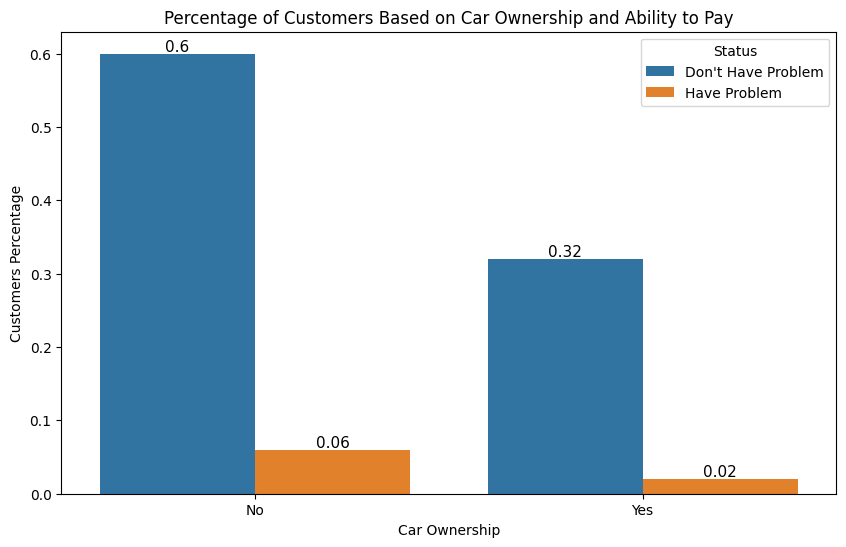

In [15]:
# Create a gender dataframe containing the number of customers by gender
car = df.groupby(['FLAG_OWN_CAR', 'Status']).size().reset_index(name='Customers')
car["FLAG_OWN_CAR"].replace("N", "No",inplace=True)
car["FLAG_OWN_CAR"].replace("Y", "Yes",inplace=True)
car['Customers_Percentage'] = round(car.Customers / car.Customers.sum(), 2)

# Create a Bar chart
plt.figure(figsize=(10,6))
ax = sns.barplot(data=car, x='FLAG_OWN_CAR', y='Customers_Percentage', hue='Status')

# Adding values on top of each bar
for p in ax.patches:
    height = p.get_height()
    if height != 0:
        ax.annotate(f'{height}',
                    (p.get_x() + p.get_width() / 2., height),
                    ha='center', va='center', fontsize=11, color='black', xytext=(0, 5),
                    textcoords='offset points')

plt.title('Percentage of Customers Based on Car Ownership and Ability to Pay')
plt.xlabel('Car Ownership')
plt.ylabel('Customers Percentage')
plt.legend(title='Status', loc='upper right')
plt.show()

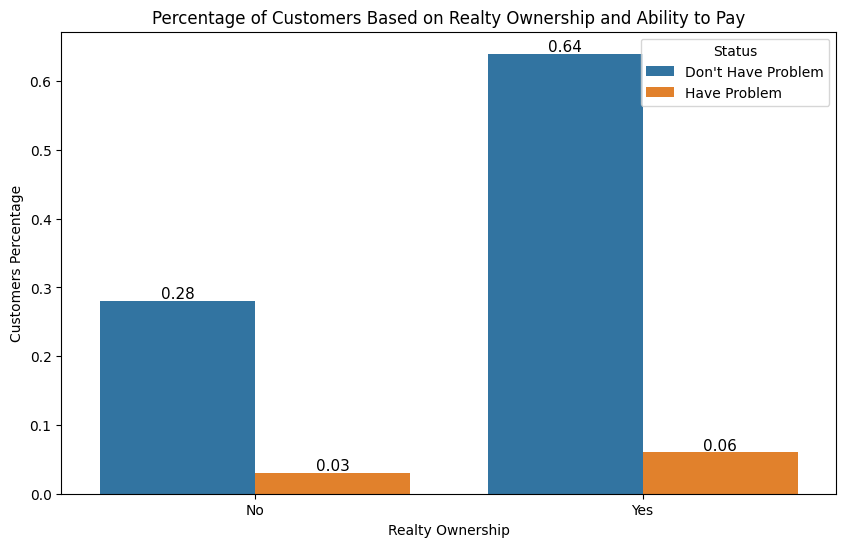

In [16]:
# Create a gender dataframe containing the number of customers by gender
realty = df.groupby(['FLAG_OWN_REALTY', 'Status']).size().reset_index(name='Customers')
realty["FLAG_OWN_REALTY"].replace("N", "No",inplace=True)
realty["FLAG_OWN_REALTY"].replace("Y", "Yes",inplace=True)
realty['Customers_Percentage'] = round(realty.Customers / realty.Customers.sum(), 2)

# Create a Bar chart
plt.figure(figsize=(10,6))
ax = sns.barplot(data=realty, x='FLAG_OWN_REALTY', y='Customers_Percentage', hue='Status')

# Adding values on top of each bar
for p in ax.patches:
    height = p.get_height()
    if height != 0:
        ax.annotate(f'{height}',
                    (p.get_x() + p.get_width() / 2., height),
                    ha='center', va='center', fontsize=11, color='black', xytext=(0, 5),
                    textcoords='offset points')

plt.title('Percentage of Customers Based on Realty Ownership and Ability to Pay')
plt.xlabel('Realty Ownership')
plt.ylabel('Customers Percentage')
plt.legend(title='Status', loc='upper right')
plt.show()

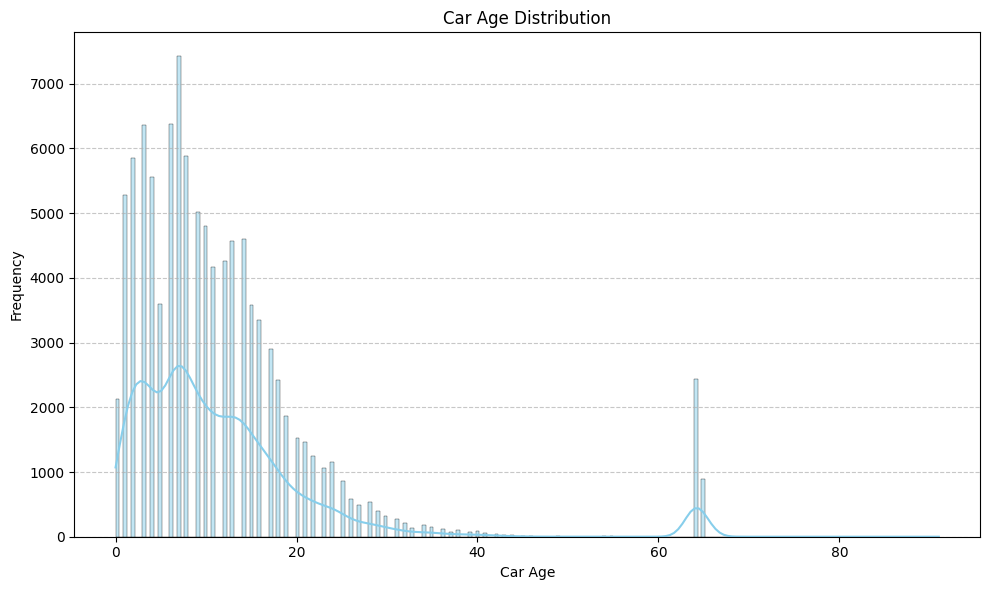

In [17]:
# Create chart size
plt.figure(figsize=(10, 6))

# Create a histogram of the age distribution of cars
sns.histplot(df['OWN_CAR_AGE'], kde=True, color='skyblue', edgecolor='black')
plt.title('Car Age Distribution')
plt.xlabel('Car Age')
plt.ylabel('Frequency')
plt.xticks(rotation=0)
plt.grid(axis='y', linestyle='--', alpha=0.7)

# Tampilkan plot
plt.tight_layout()
plt.show()

### Residence information

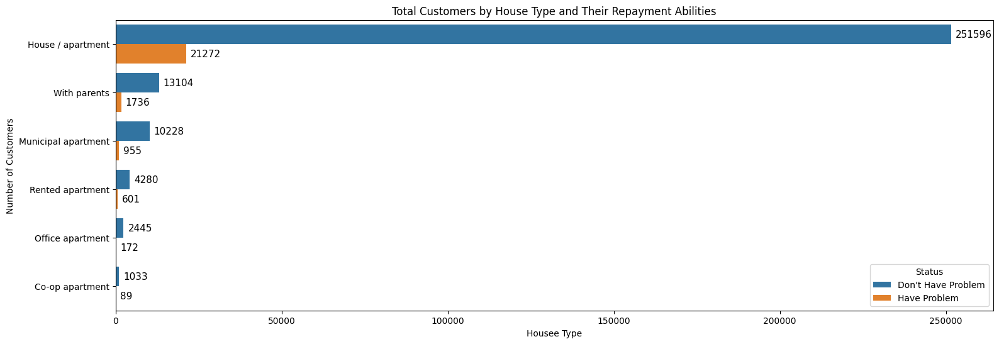

In [18]:
# Grouping by number of children and counting the number of each one
house_type = df.groupby(['NAME_HOUSING_TYPE', 'Status']).size().reset_index(name='Customers')

# Delete "Unknown" Data
house_type = house_type.loc[house_type['NAME_HOUSING_TYPE'] != np.NaN]

# Sort DataFrame based on 'Customers'
house_type = house_type.sort_values(by=['Status', 'Customers'], ascending=[True, False])

# Create a Bar Chart
plt.figure(figsize=(18, 6))
ax = sns.barplot(data=house_type, x='Customers', y='NAME_HOUSING_TYPE', hue='Status', orient='h')

# Adding values on the right side of each bar
for p in ax.patches:
    width = p.get_width()
    if width != 0:
        ax.annotate(f'{int(width)}',
                    (p.get_x() + width, p.get_y() + p.get_height() / 2),
                    va='center', fontsize=11, color='black', xytext=(5, 0),
                    textcoords='offset points')

plt.title('Total Customers by House Type and Their Repayment Abilities')
plt.xlabel('Housee Type')
plt.ylabel('Number of Customers')
plt.legend(title='Status', loc='lower right')
plt.show()

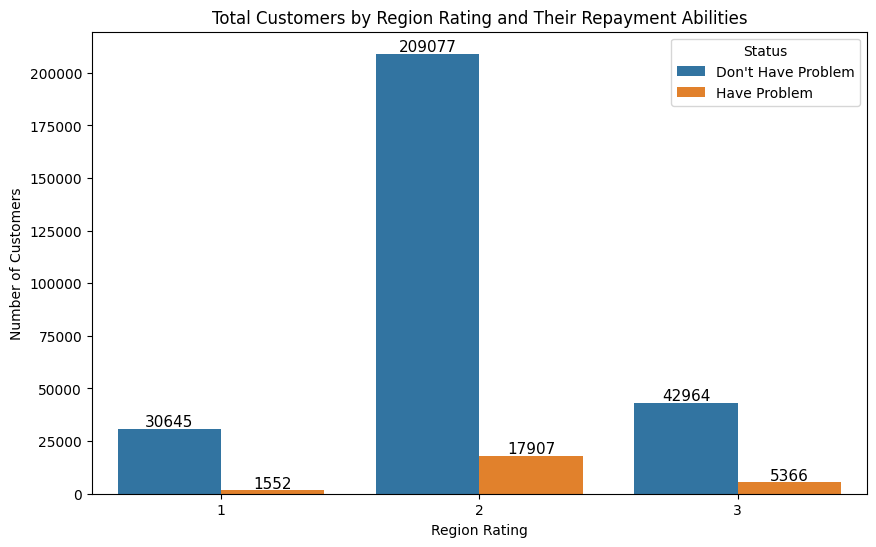

In [19]:
# Grouping by number of children and counting the number of each one
region_rating = df.groupby(['REGION_RATING_CLIENT', 'Status']).size().reset_index(name='Customers')

# Delete "Unknown" Data
region_rating = region_rating.loc[region_rating['REGION_RATING_CLIENT'] != np.NaN]

# Sort DataFrame based on 'Customers'
region_rating = region_rating.sort_values(by=['Status', 'Customers'], ascending=[True, False])

# Create a Bar Chart
plt.figure(figsize=(10, 6))
ax = sns.barplot(data=region_rating, x='REGION_RATING_CLIENT', y='Customers', hue='Status')

# Adding values on top of each bar
for p in ax.patches:
    height = p.get_height()
    if height != 0:
        ax.annotate(f'{int(height)}',
                    (p.get_x() + p.get_width() / 2., height),
                    ha='center', va='center', fontsize=11, color='black', xytext=(0, 5),
                    textcoords='offset points')

plt.title('Total Customers by Region Rating and Their Repayment Abilities')
plt.xlabel('Region Rating')
plt.ylabel('Number of Customers')
plt.legend(title='Status', loc='upper right')
plt.show()

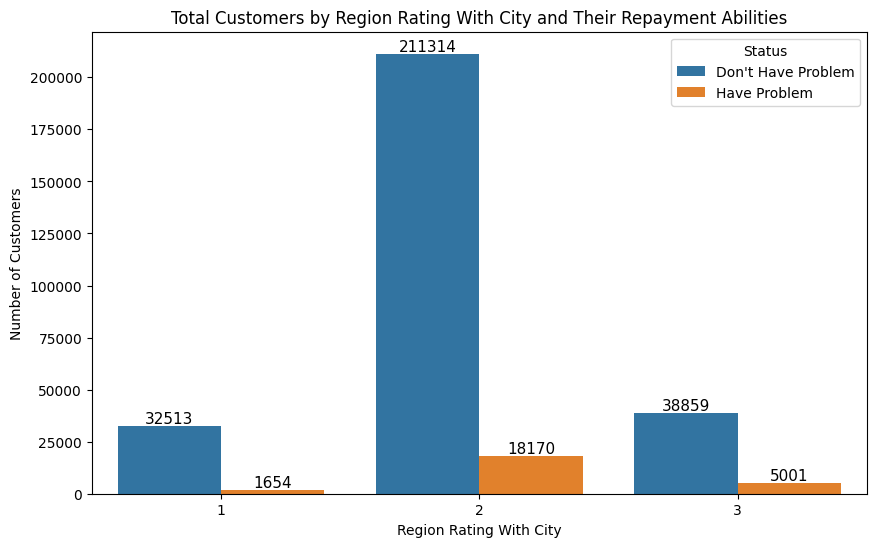

In [20]:
# Grouping by number of children and counting the number of each one
region_rating_city = df.groupby(['REGION_RATING_CLIENT_W_CITY', 'Status']).size().reset_index(name='Customers')

# Delete "Unknown" Data
region_rating_city = region_rating_city.loc[region_rating_city['REGION_RATING_CLIENT_W_CITY'] != np.NaN]

# Sort DataFrame based on 'Customers'
region_rating_city = region_rating_city.sort_values(by=['Status', 'Customers'], ascending=[True, False])

# Create a Bar Chart
plt.figure(figsize=(10, 6))
ax = sns.barplot(data=region_rating_city, x='REGION_RATING_CLIENT_W_CITY', y='Customers', hue='Status')

# Adding values on top of each bar
for p in ax.patches:
    height = p.get_height()
    if height != 0:
        ax.annotate(f'{int(height)}',
                    (p.get_x() + p.get_width() / 2., height),
                    ha='center', va='center', fontsize=11, color='black', xytext=(0, 5),
                    textcoords='offset points')

plt.title('Total Customers by Region Rating With City and Their Repayment Abilities')
plt.xlabel('Region Rating With City')
plt.ylabel('Number of Customers')
plt.legend(title='Status', loc='upper right')
plt.show()

### Contact and communication information

In [21]:
# Create Variables from each data that you want to combine
FLAG_EMP_PHONE = df.groupby(['Status','FLAG_EMP_PHONE']).size().reset_index(name='EMP PHONE')
FLAG_WORK_PHONE = df.groupby(['Status','FLAG_WORK_PHONE']).size().reset_index(name='WORK PHONE')
FLAG_CONT_MOBILE = df.groupby(['Status','FLAG_CONT_MOBILE']).size().reset_index(name='CONT MOBILE')
FLAG_PHONE = df.groupby(['Status','FLAG_PHONE']).size().reset_index(name='PHONE')
FLAG_EMAIL = df.groupby(['Status','FLAG_EMAIL']).size().reset_index(name='EMAIL')

# Combine all the variables into one
communication = pd.concat([FLAG_EMP_PHONE, FLAG_WORK_PHONE, FLAG_CONT_MOBILE, FLAG_PHONE, FLAG_EMAIL], axis=1)

# Delete columns that are not needed
communication = communication.drop(['Status', 'FLAG_EMP_PHONE', 'FLAG_WORK_PHONE', 'FLAG_CONT_MOBILE', 'FLAG_PHONE', 'FLAG_EMAIL'], axis=1)

# Add status data
Status = ["Don't Have Problem", "Don't Have Problem", "Have Problem", "Have Problem"]
Status2 = ["No", "Yes", "No", "Yes"]

# Add status data to communication data
communication.insert(0, 'Status', Status)
communication.insert(1, 'Communication', Status2)
communication

,Status,Communication,EMP PHONE,WORK PHONE,CONT MOBILE,PHONE,EMAIL
0,Don't Have Problem,No,52395,227282,529,202336,266618
1,Don't Have Problem,Yes,230291,55404,282157,80350,16068
2,Have Problem,No,2991,18921,45,18744,23451
3,Have Problem,Yes,21834,5904,24780,6081,1374


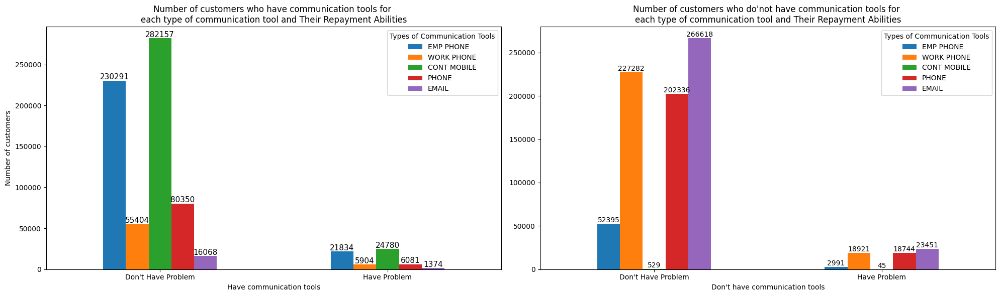

In [22]:
# Define the column as having communication tools and not
have_communication = communication[communication["Communication"] == "Yes"].drop(['Communication'], axis=1)
no_communication = communication[communication["Communication"] == "No"].drop(['Communication'], axis=1)

# Determine the size of the chart
fig = plt.figure(figsize=(20, 6))

# Creating the first subplot
ax1 = fig.add_subplot(1, 2, 1)

have_communication.set_index('Status').plot(kind='bar', ax=ax1, title='Number of customers who have communication tools for \neach type of communication tool and Their Repayment Abilities', rot=0)
ax1.set_xlabel('Have communication tools')
ax1.set_ylabel('Number of customers')
ax1.legend(title='Types of Communication Tools')

# Display the value of each data above each bar
for p in ax1.patches:
    height = p.get_height()
    if height != 0:
        ax1.annotate(f'{int(height)}',
                    (p.get_x() + p.get_width() / 2., height),
                    ha='center', va='center', fontsize=11, color='black', xytext=(0, 5),
                    textcoords='offset points')

# Creating the second subplot
ax2 = fig.add_subplot(1, 2, 2)

no_communication.set_index('Status').plot(kind='bar', ax=ax2, title="Number of customers who do'not have communication tools for \neach type of communication tool and Their Repayment Abilities", rot=0)
ax2.set_xlabel("Don't have communication tools")
ax2.legend(title='Types of Communication Tools')

# Display the value of each data above each bar
for p in ax2.patches:
    height = p.get_height()
    if height != 0:
        ax2.annotate(f'{int(height)}',
                    (p.get_x() + p.get_width() / 2., height),
                    ha='center', va='center', fontsize=10, color='black', xytext=(0, 5),
                    textcoords='offset points')

plt.tight_layout()
plt.show()

## Data Cleaning

In [23]:
# Converting XNA to NaN
train.replace("XNA", np.nan,inplace=True)

### Handling missing values

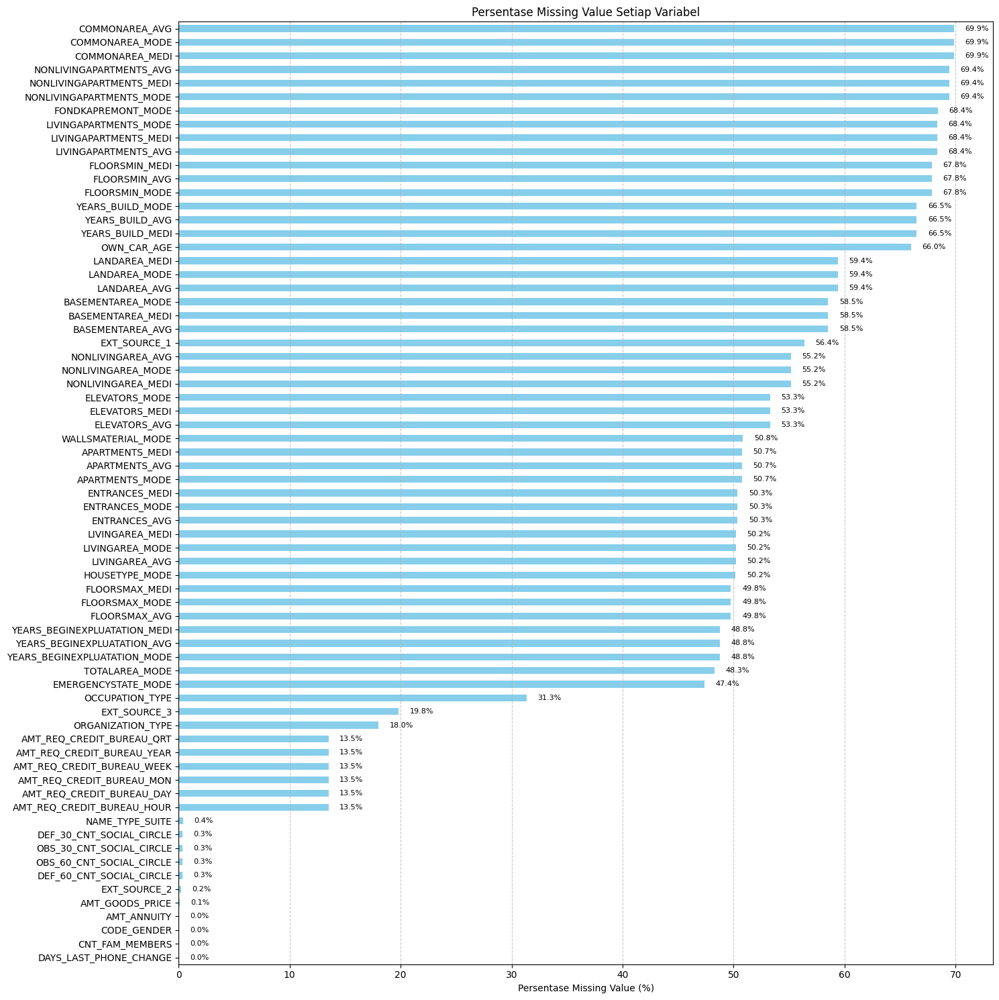

In [24]:
# Check the number of missing values
missing_percentages = train.isnull().mean() * 100

# Sort from largest
missing_percentages = missing_percentages.sort_values(ascending=True)

# Filter only variables with missing_percentages greater than 0
missing_percentages = missing_percentages[missing_percentages > 0]

# Create plot
plt.figure(figsize=(15, 15))
ax = missing_percentages.plot(kind='barh', color='skyblue')
plt.title('Persentase Missing Value Setiap Variabel')
plt.xlabel('Persentase Missing Value (%)')
plt.grid(axis='x', linestyle='--', alpha=0.7)

# Show values on the side bar
for i, v in enumerate(missing_percentages):
    ax.text(v + 1, i, f"{v:.1f}%", va='center', ha='left', rotation=0, fontsize=8)

plt.tight_layout()
plt.show()

In [25]:
# Check for missing value data
missing_percentages

DAYS_LAST_PHONE_CHANGE       0.000325
CNT_FAM_MEMBERS              0.000650
CODE_GENDER                  0.001301
AMT_ANNUITY                  0.003902
AMT_GOODS_PRICE              0.090403
                              ...    
NONLIVINGAPARTMENTS_MEDI    69.432963
NONLIVINGAPARTMENTS_AVG     69.432963
COMMONAREA_MEDI             69.872297
COMMONAREA_MODE             69.872297
COMMONAREA_AVG              69.872297
Length: 69, dtype: float64

Because the percentage of missing values from some columns is more than 30%, we have to delete some of the columns. In this case we do not use a minimum of 40% because the OCCUPATION_TYPE variable is a categorical variable so that when imputation is done it will cause data centered on one category only.

In [26]:
# Filter only variables with a missing value percentage of more than 30
missing_percentages_filtered = missing_percentages[missing_percentages > 30]

# Data dictionary
data_missing = {
    'Variable': missing_percentages_filtered.index,  # Variable name column
    'Missing_Percentage': missing_percentages_filtered.values  # Missing value percentage column
}

# Create DataFrame
missing = pd.DataFrame(data_missing)

# List columns that have more than 30 missing values
data_NaN = list(missing['Variable'])

# Delete listed data and id data
train = train.drop(columns = data_NaN)
train = train.drop(columns = 'SK_ID_CURR')

# Print data train
train.head()

,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,...,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
0,1,Cash loans,M,N,Y,0,202500.0,406597.5,24700.5,351000.0,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,1.0
1,0,Cash loans,F,N,N,0,270000.0,1293502.5,35698.5,1129500.0,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
2,0,Revolving loans,M,Y,Y,0,67500.0,135000.0,6750.0,135000.0,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
3,0,Cash loans,F,N,Y,0,135000.0,312682.5,29686.5,297000.0,...,0,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN
4,0,Cash loans,M,N,Y,0,121500.0,513000.0,21865.5,513000.0,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0


In [27]:
# Remove Flag Document
FLAG_DOCUMENT = [col for col in train.columns if 'FLAG_DOCUMENT' in col]
train.drop(columns = FLAG_DOCUMENT, axis=1, inplace=True)

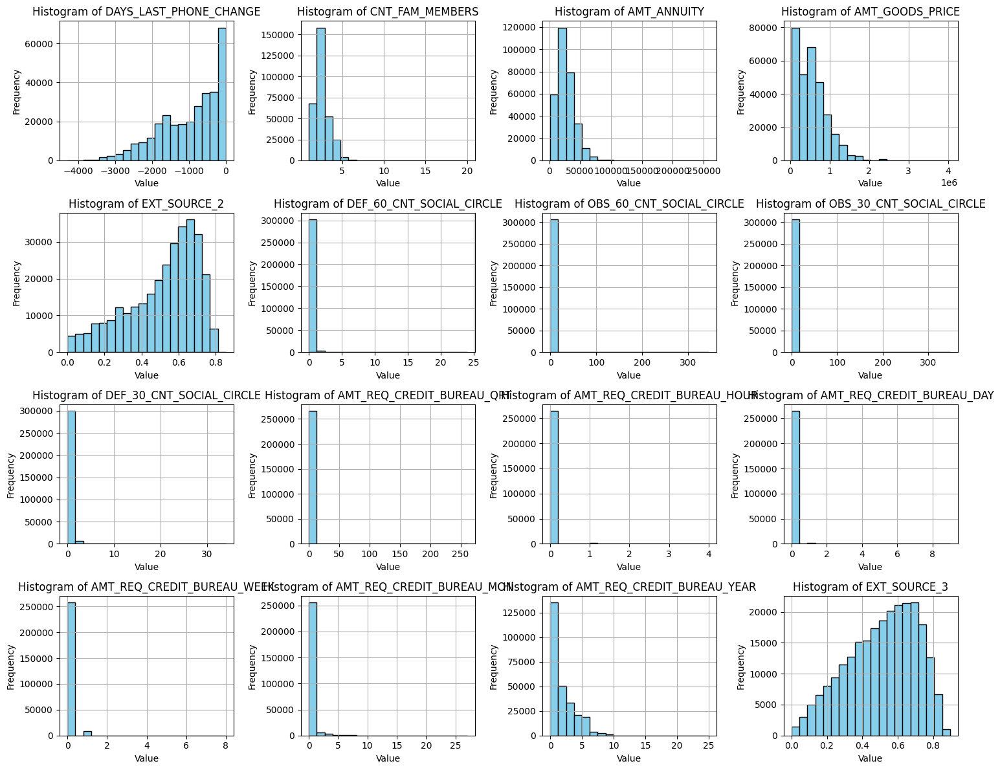

In [28]:
# Check the number of missing values
missing_data = train.isnull().mean() * 100

# Sort from largest
missing_data = missing_data.sort_values(ascending=True)

# Filter only variables with missing_percentages greater than 0
missing_data = missing_data[missing_data > 0]

# List the columns of missing values
hist = train[list(missing_data.index)]

# Identifying numeric variables
numeric_columns = hist.select_dtypes(include=['float64', 'int64']).columns

# Calculating the number of subplots required
num_subplots = len(numeric_columns)

# Set up a subplot grid
num_rows = (num_subplots // 4) + (num_subplots % 4 > 0)
fig, axs = plt.subplots(num_rows, 4, figsize=(15, 3*num_rows))

# Loop to create a histogram of each variable in missing_value
for i, column in enumerate(numeric_columns):
    row = i // 4
    col = i % 4
    axs[row, col].hist(train[column], bins=20, color='skyblue', edgecolor='black')
    axs[row, col].set_title(f'Histogram of {column}')
    axs[row, col].set_xlabel('Value')
    axs[row, col].set_ylabel('Frequency')
    axs[row, col].grid(True)

# Set the distance between subplots
plt.tight_layout()
plt.show()

Because there is no normal data, we can fill the missing value of numeric data with the median value of the data. And we can also fill categorical data with mode data.

In [29]:
category_columns = train.select_dtypes(include=['object']).columns.tolist()
numerik_columns = train.select_dtypes(include=['int64','float64']).columns.tolist()

for column in train:
    if train[column].isnull().any():
        if(column in category_columns):
            train[column]=train[column].fillna(train[column].mode()[0])
        else:
            train[column]=train[column].fillna(train[column].median())

In [30]:
# after imputation
print('Missing values status:', train.isnull().values.any())

Missing values status: False


### Handling duplicated data

In [31]:
# Check for duplicate data
train.duplicated().sum()

0

### Handling Outlier

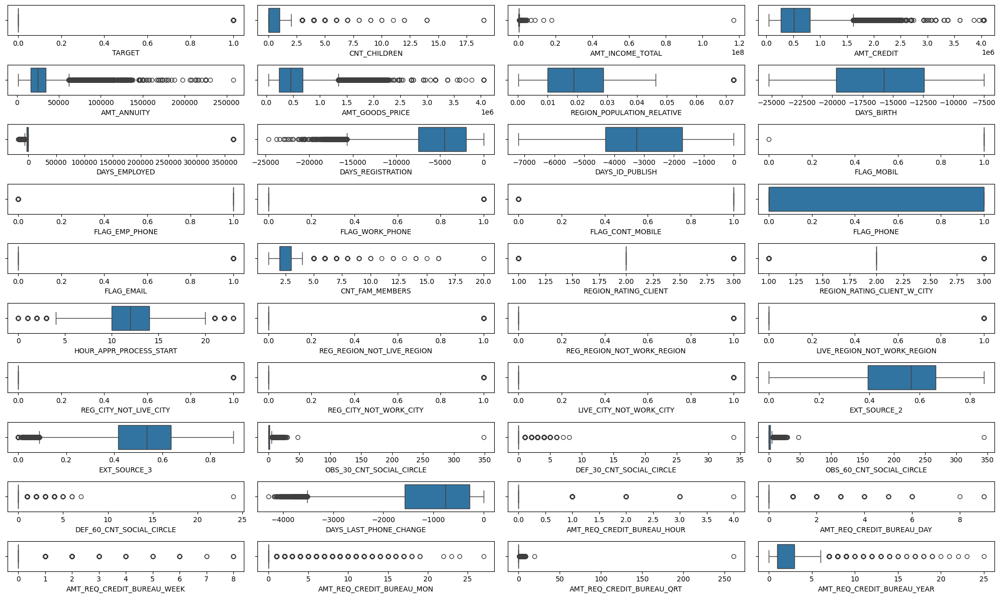

In [32]:
plt.figure(figsize=(20,12))

for i, column in enumerate(train[numerik_columns].columns, 1):
    plt.subplot(10,4,i)
    sns.boxplot(data=train[numerik_columns], x=train[column])
    plt.tight_layout()

There are some columns that have extreme outlier values so we need to remove them.

In [33]:
# Columns to be removed outliers
columns_with_outliers = ['AMT_CREDIT', 'AMT_ANNUITY', 'AMT_GOODS_PRICE']

for column in columns_with_outliers:
    # Calculate the z-score for the selected column
    zscore = abs(stats.zscore(train[column]))

    # Filter to remove outliers
    filtered_entries = (zscore < 3)
    train = train[filtered_entries]

    print(f'Row after delete outlier at {column}: {len(train)}')

Row after delete outlier at AMT_CREDIT: 304256
Row after delete outlier at AMT_ANNUITY: 301491
Row after delete outlier at AMT_GOODS_PRICE: 298284


## Pre-Processing

### Feature Transformation

In [34]:
# Selects columns in the DataFrame train that have data type 'object'
objec = train.select_dtypes(include='object')
train_obj = pd.DataFrame(objec.nunique(), columns = ['Total_unique']).reset_index()
train_obj = train_obj.rename(columns = {'index' : 'Name_of_column'})

# Separate columns to do label encoder and one hot encoding
obj_1 = []
obj_2 = []
for i,y in enumerate(train_obj.Name_of_column):
    if train_obj['Total_unique'][i] > 2:
        obj_1.append(y)
    else:
        obj_2.append(y)

In [35]:
# One Hot Encoding
for cat in obj_1:
    onehots = pd.get_dummies(objec[cat], prefix=cat)
    obj = objec.join(onehots)

# Label Encoder
label_encoder = preprocessing.LabelEncoder()

# Encode labels in column 'species'.
for cat in obj_2:
    obj[cat]= label_encoder.fit_transform(objec[cat])

In [36]:
# Merge train data and encoded data
df_train = pd.concat([train, obj], axis=1)

# Get the column name from the DataFrame as a list
columns_to_drop = list(objec.columns.values)

# Drop the columns in the list
df_train.drop(columns=columns_to_drop, inplace=True)
df_train

,TARGET,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,...,ORGANIZATION_TYPE_Trade: type 3,ORGANIZATION_TYPE_Trade: type 4,ORGANIZATION_TYPE_Trade: type 5,ORGANIZATION_TYPE_Trade: type 6,ORGANIZATION_TYPE_Trade: type 7,ORGANIZATION_TYPE_Transport: type 1,ORGANIZATION_TYPE_Transport: type 2,ORGANIZATION_TYPE_Transport: type 3,ORGANIZATION_TYPE_Transport: type 4,ORGANIZATION_TYPE_University
0,1,0,202500.0,406597.5,24700.5,351000.0,0.018801,-9461,-637,-3648.0,...,0,0,0,0,0,0,0,0,0,0
1,0,0,270000.0,1293502.5,35698.5,1129500.0,0.003541,-16765,-1188,-1186.0,...,0,0,0,0,0,0,0,0,0,0
2,0,0,67500.0,135000.0,6750.0,135000.0,0.010032,-19046,-225,-4260.0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,135000.0,312682.5,29686.5,297000.0,0.008019,-19005,-3039,-9833.0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,121500.0,513000.0,21865.5,513000.0,0.028663,-19932,-3038,-4311.0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
307506,0,0,157500.0,254700.0,27558.0,225000.0,0.032561,-9327,-236,-8456.0,...,0,0,0,0,0,0,0,0,0,0
307507,0,0,72000.0,269550.0,12001.5,225000.0,0.025164,-20775,365243,-4388.0,...,0,0,0,0,0,0,0,0,0,0
307508,0,0,153000.0,677664.0,29979.0,585000.0,0.005002,-14966,-7921,-6737.0,...,0,0,0,0,0,0,0,0,0,0
307509,1,0,171000.0,370107.0,20205.0,319500.0,0.005313,-11961,-4786,-2562.0,...,0,0,0,0,0,0,0,0,0,0


### Split Data

In [37]:
x = df_train.drop(columns = 'TARGET')
y = df_train['TARGET']

In [38]:
# Oversampling
sm = SMOTE(random_state = 2)
x_over, y_over = sm.fit_resample(x, y.ravel())
x_train, x_test, y_train, y_test = train_test_split(x_over, y_over, test_size=0.2, random_state=42)

In [39]:
# Undersampling
rus = RandomUnderSampler(random_state=42)
x_under, y_under = rus.fit_resample(x, y.ravel())
x_train2, x_test2, y_train2, y_test2 = train_test_split(x_under, y_under, test_size=0.3, random_state=42)

In [40]:
def confusionmatrix(predictions, y_test):
    cm = confusion_matrix(y_test, predictions)
    disp = ConfusionMatrixDisplay(confusion_matrix=cm)
    return disp.plot()

## Model : Logistic Regression

### Oversampling Model

/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:458: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression



              precision    recall  f1-score   support

           0       0.57      0.63      0.60    218905
           1       0.59      0.53      0.56    219221

    accuracy                           0.58    438126
   macro avg       0.58      0.58      0.58    438126
weighted avg       0.58      0.58      0.58    438126



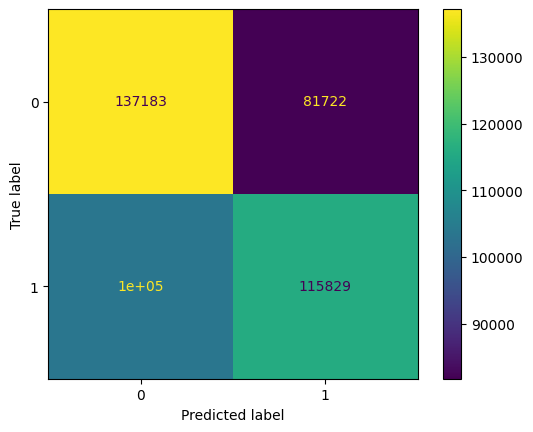

In [41]:
lr1 = LogisticRegression()
lr1.fit(x_train, y_train.ravel())

predictions = lr1.predict(x_train)

# print classification report
print(classification_report(y_train, predictions))
confusionmatrix(predictions, y_train)

              precision    recall  f1-score   support

           0       0.57      0.63      0.60     54924
           1       0.59      0.53      0.56     54608

    accuracy                           0.58    109532
   macro avg       0.58      0.58      0.58    109532
weighted avg       0.58      0.58      0.58    109532



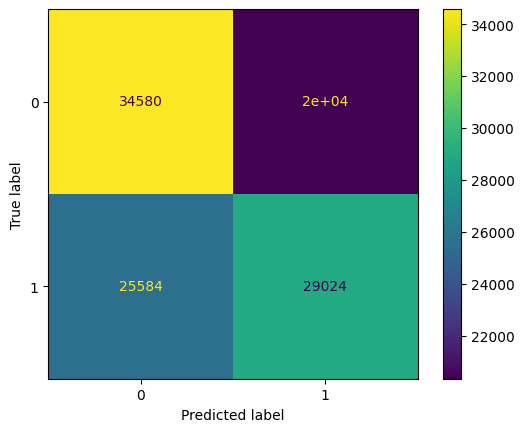

In [42]:
predictions = lr1.predict(x_test)

# print classification report
print(classification_report(y_test, predictions))
confusionmatrix(predictions, y_test)

### Undersampling Model

              precision    recall  f1-score   support

           0       0.57      0.63      0.60     17155
           1       0.58      0.52      0.55     17082

    accuracy                           0.57     34237
   macro avg       0.57      0.57      0.57     34237
weighted avg       0.57      0.57      0.57     34237



/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:458: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression



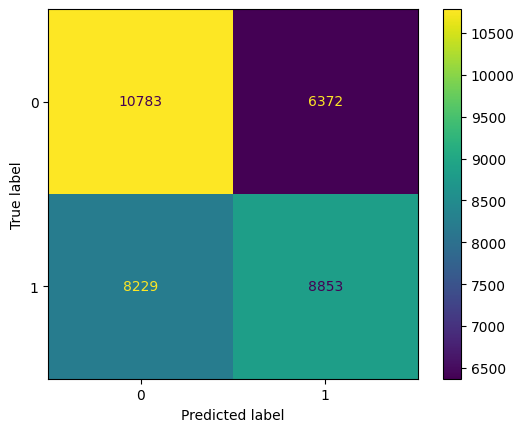

In [43]:
lr2 = LogisticRegression()
lr2.fit(x_train2, y_train2)

predictions = lr2.predict(x_train2)

# print classification report
print(classification_report(y_train2, predictions))
confusionmatrix(predictions, y_train2)

              precision    recall  f1-score   support

           0       0.57      0.63      0.59      7300
           1       0.59      0.52      0.55      7373

    accuracy                           0.57     14673
   macro avg       0.58      0.57      0.57     14673
weighted avg       0.58      0.57      0.57     14673



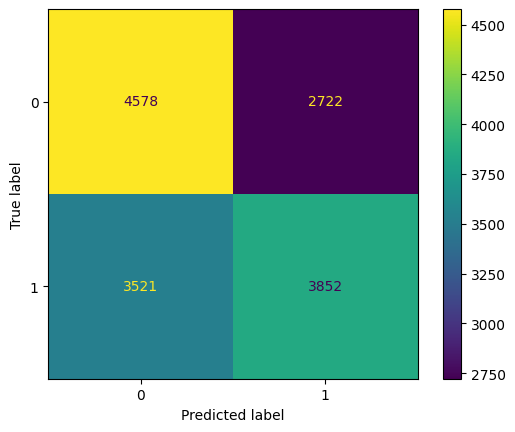

In [44]:
predictions2 = lr2.predict(x_test2)

# print classification report
print(classification_report(y_test2, predictions2))
confusionmatrix(predictions2, y_test2)

## Model : XGBoost

### Oversampling model

              precision    recall  f1-score   support

           0       0.91      1.00      0.95    218905
           1       1.00      0.91      0.95    219221

    accuracy                           0.95    438126
   macro avg       0.96      0.95      0.95    438126
weighted avg       0.96      0.95      0.95    438126



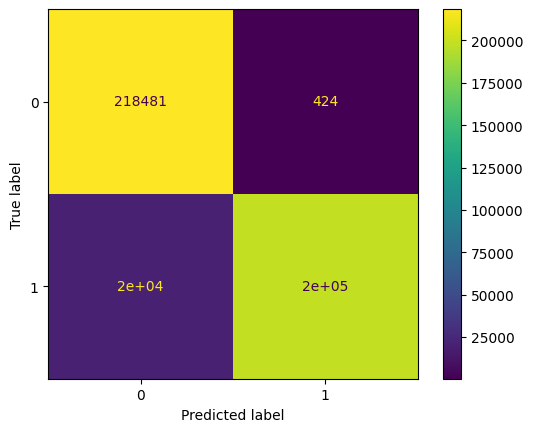

In [45]:
xgb_model = xgb.XGBClassifier(objective="binary:logistic", random_state=42)
xgb_model.fit(x_train, y_train.ravel())

predictions = xgb_model.predict(x_train)

# print classification report
print(classification_report(y_train, predictions))
confusionmatrix(predictions, y_train)

              precision    recall  f1-score   support

           0       0.91      1.00      0.95     54924
           1       1.00      0.90      0.95     54608

    accuracy                           0.95    109532
   macro avg       0.95      0.95      0.95    109532
weighted avg       0.95      0.95      0.95    109532



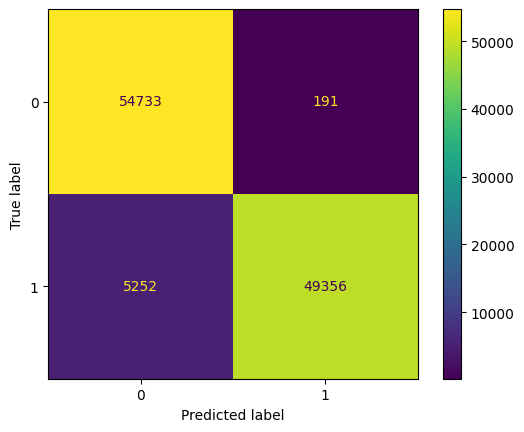

In [46]:
predictions = xgb_model.predict(x_test)

# print classification report
print(classification_report(y_test, predictions))
confusionmatrix(predictions, y_test)

### Undersampling model

              precision    recall  f1-score   support

           0       0.81      0.81      0.81     17155
           1       0.81      0.81      0.81     17082

    accuracy                           0.81     34237
   macro avg       0.81      0.81      0.81     34237
weighted avg       0.81      0.81      0.81     34237



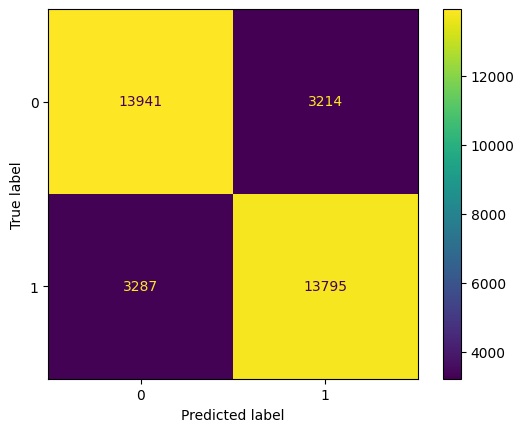

In [47]:
xgb_model2 = xgb.XGBClassifier(objective="binary:logistic", random_state=42)
xgb_model2.fit(x_train2, y_train2.ravel())

predictions = xgb_model2.predict(x_train2)

# print classification report
print(classification_report(y_train2, predictions))
confusionmatrix(predictions, y_train2)

              precision    recall  f1-score   support

           0       0.66      0.67      0.66      7300
           1       0.67      0.65      0.66      7373

    accuracy                           0.66     14673
   macro avg       0.66      0.66      0.66     14673
weighted avg       0.66      0.66      0.66     14673



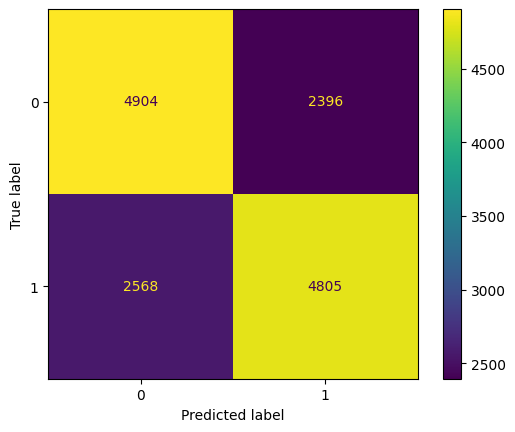

In [48]:
predictions = xgb_model2.predict(x_test2)

# print classification report
print(classification_report(y_test2, predictions))
confusionmatrix(predictions, y_test2)

## Model : Random Forest

### Oversampling

              precision    recall  f1-score   support

           0       1.00      1.00      1.00    218905
           1       1.00      1.00      1.00    219221

    accuracy                           1.00    438126
   macro avg       1.00      1.00      1.00    438126
weighted avg       1.00      1.00      1.00    438126



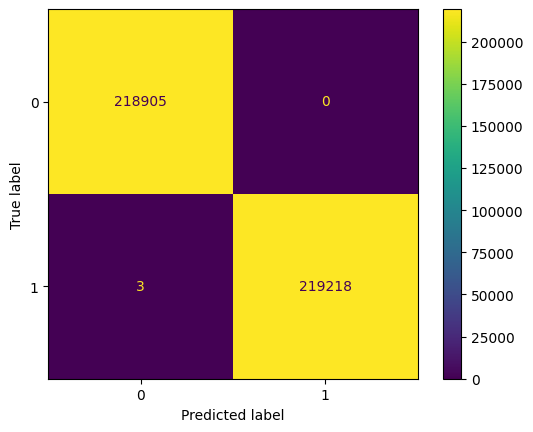

In [49]:
rf_model = RandomForestClassifier().fit(x_train, y_train)
predictions = rf_model.predict(x_train)

# print classification report
print(classification_report(y_train, predictions))
confusionmatrix(predictions, y_train)

              precision    recall  f1-score   support

           0       0.91      1.00      0.95     54924
           1       1.00      0.90      0.95     54608

    accuracy                           0.95    109532
   macro avg       0.95      0.95      0.95    109532
weighted avg       0.95      0.95      0.95    109532



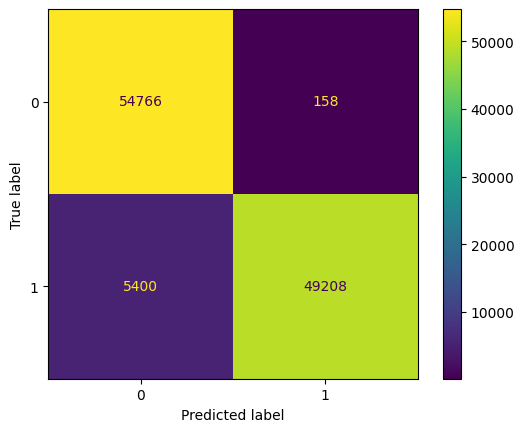

In [50]:
predictions = rf_model.predict(x_test)

# print classification report
print(classification_report(y_test, predictions))
confusionmatrix(predictions, y_test)

### Undersampling

              precision    recall  f1-score   support

           0       1.00      1.00      1.00     17155
           1       1.00      1.00      1.00     17082

    accuracy                           1.00     34237
   macro avg       1.00      1.00      1.00     34237
weighted avg       1.00      1.00      1.00     34237



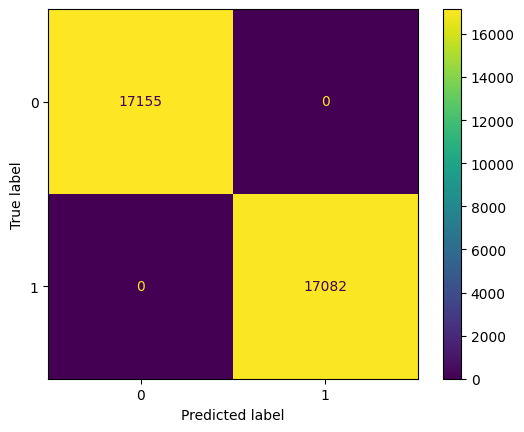

In [51]:
rf_model2 = RandomForestClassifier().fit(x_train2, y_train2)
predictions = rf_model2.predict(x_train2)

# print classification report
print(classification_report(y_train2, predictions))
confusionmatrix(predictions, y_train2)

              precision    recall  f1-score   support

           0       0.66      0.68      0.67      7300
           1       0.67      0.65      0.66      7373

    accuracy                           0.66     14673
   macro avg       0.66      0.66      0.66     14673
weighted avg       0.66      0.66      0.66     14673



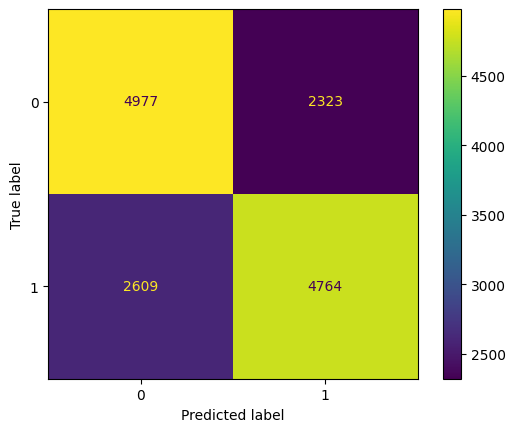

In [52]:
predictions = rf_model2.predict(x_test2)

# print classification report
print(classification_report(y_test2, predictions))
confusionmatrix(predictions, y_test2)

## Prediction

### Handle Missing Value and duplicated data

In [53]:
# Converting XNA to NaN
test.replace("XNA", np.nan,inplace=True)

# Check the number of missing values
missing_percentages = test.isnull().mean() * 100

# Sort from largest
missing_percentages = missing_percentages.sort_values(ascending=True)

# Filter only variables with a missing value percentage of more than 30
missing_percentages_filtered = missing_percentages[missing_percentages > 30]

# Data dictionary
data_missing = {
    'Variable': missing_percentages_filtered.index,  # Variable name column
    'Missing_Percentage': missing_percentages_filtered.values  # Missing value percentage column
}

# Create DataFrame
missing = pd.DataFrame(data_missing)

# List columns that have more than 30 missing values
data_NaN = list(missing['Variable'])

# Delete listed data and id data
test = test.drop(columns = data_NaN)

# Remove Flag Document
FLAG_DOCUMENT = [col for col in test.columns if 'FLAG_DOCUMENT' in col]
test.drop(columns = FLAG_DOCUMENT, axis=1, inplace=True)

category_columns = test.select_dtypes(include=['object']).columns.tolist()
numerik_columns = test.select_dtypes(include=['int64','float64']).columns.tolist()

for column in test:
    if test[column].isnull().any():
        if(column in category_columns):
            test[column]=test[column].fillna(test[column].mode()[0])
        else:
            test[column]=test[column].fillna(test[column].median())

# after imputation
print('Missing values status:', test.isnull().values.any())

Missing values status: False


In [54]:
# Check for duplicate data
test.duplicated().sum()

0

### Transformation

In [55]:
# Selects columns in the DataFrame test_obj that have data type 'object'
objec1 = test.select_dtypes(include='object')
test_obj = pd.DataFrame(objec.nunique(), columns = ['Total_unique']).reset_index()
test_obj = test_obj.rename(columns = {'index' : 'Name_of_column'})

# Separate columns to do label encoder and one hot encoding
obj_11 = []
obj_22 = []
for i,y in enumerate(test_obj.Name_of_column):
    if test_obj['Total_unique'][i] > 2:
        obj_11.append(y)
    else:
        obj_22.append(y)

In [56]:
# One Hot Encoding
for cat in obj_11:
    onehots = pd.get_dummies(objec1[cat], prefix=cat)
    obj1 = objec1.join(onehots)

# Label Encoder
label_encoder = preprocessing.LabelEncoder()

# Encode labels in column 'species'.
for cat in obj_22:
    obj1[cat]= label_encoder.fit_transform(objec1[cat])

In [57]:
# Merge test data and encoded data
df_test = pd.concat([test, obj1], axis=1)

# Get the column name from the DataFrame as a list
columns_to_drop = list(objec1.columns.values)

# Drop the columns in the list
df_test.drop(columns=columns_to_drop, inplace=True)
id = df_test['SK_ID_CURR']
df_test = df_test.drop(columns = 'SK_ID_CURR')
df_test

,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,...,ORGANIZATION_TYPE_Trade: type 3,ORGANIZATION_TYPE_Trade: type 4,ORGANIZATION_TYPE_Trade: type 5,ORGANIZATION_TYPE_Trade: type 6,ORGANIZATION_TYPE_Trade: type 7,ORGANIZATION_TYPE_Transport: type 1,ORGANIZATION_TYPE_Transport: type 2,ORGANIZATION_TYPE_Transport: type 3,ORGANIZATION_TYPE_Transport: type 4,ORGANIZATION_TYPE_University
0,0,135000.0,568800.0,20560.5,450000.0,0.018850,-19241,-2329,-5170.0,-812,...,0,0,0,0,0,0,0,0,0,0
1,0,99000.0,222768.0,17370.0,180000.0,0.035792,-18064,-4469,-9118.0,-1623,...,0,0,0,0,0,0,0,0,0,0
2,0,202500.0,663264.0,69777.0,630000.0,0.019101,-20038,-4458,-2175.0,-3503,...,0,0,0,0,0,0,0,1,0,0
3,2,315000.0,1575000.0,49018.5,1575000.0,0.026392,-13976,-1866,-2000.0,-4208,...,0,0,0,0,0,0,0,0,0,0
4,1,180000.0,625500.0,32067.0,625500.0,0.010032,-13040,-2191,-4000.0,-4262,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
48739,0,121500.0,412560.0,17473.5,270000.0,0.002042,-19970,-5169,-9094.0,-3399,...,0,0,0,0,0,0,0,0,0,0
48740,2,157500.0,622413.0,31909.5,495000.0,0.035792,-11186,-1149,-3015.0,-3003,...,0,0,0,0,1,0,0,0,0,0
48741,1,202500.0,315000.0,33205.5,315000.0,0.026392,-15922,-3037,-2681.0,-1504,...,0,0,0,0,0,0,0,0,0,0
48742,0,225000.0,450000.0,25128.0,450000.0,0.018850,-13968,-2731,-1461.0,-1364,...,0,0,0,0,0,0,0,0,0,0


### Random Forest Prediction

In [58]:
predictions = rf_model.predict(df_test)

In [59]:
test_submisson = pd.DataFrame()
test_submisson["SK_ID_CURR"] = id
test_submisson["TARGET"] = predictions
test_submisson

,SK_ID_CURR,TARGET
0,100001,0
1,100005,0
2,100013,0
3,100028,0
4,100038,0
...,...,...
48739,456221,0
48740,456222,0
48741,456223,0
48742,456224,0


In [60]:
test_submisson['TARGET'].value_counts()

0    48538
1      206
Name: TARGET, dtype: int64

In [61]:
# Save Test reslut to csv
test_submisson.to_csv('Test result.csv', index=False)